In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


**TASK 1.1 - DATA VISUALIZATION**

Importing necessary libraries

In [27]:
import os
import json
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

Setting data and image paths

In [28]:
# I have manually uploaded the data from github to my google drive
# (putting a repository cloning command in this notebook causes error)

data_dir = "/gdrive/My Drive/Assignment/Task_1/Data Visualization/data"
image_dir = "/gdrive/My Drive/Assignment/Task_1/Data Visualization/images"

Visualization

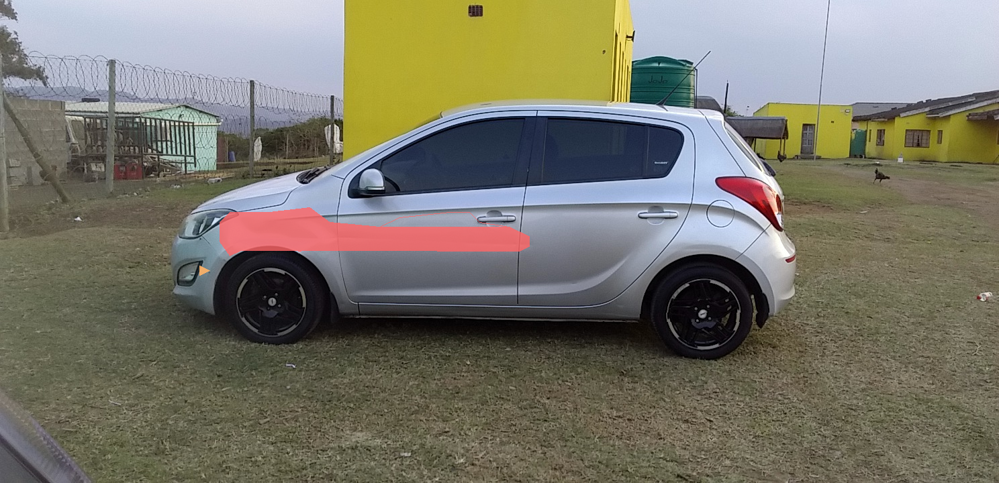

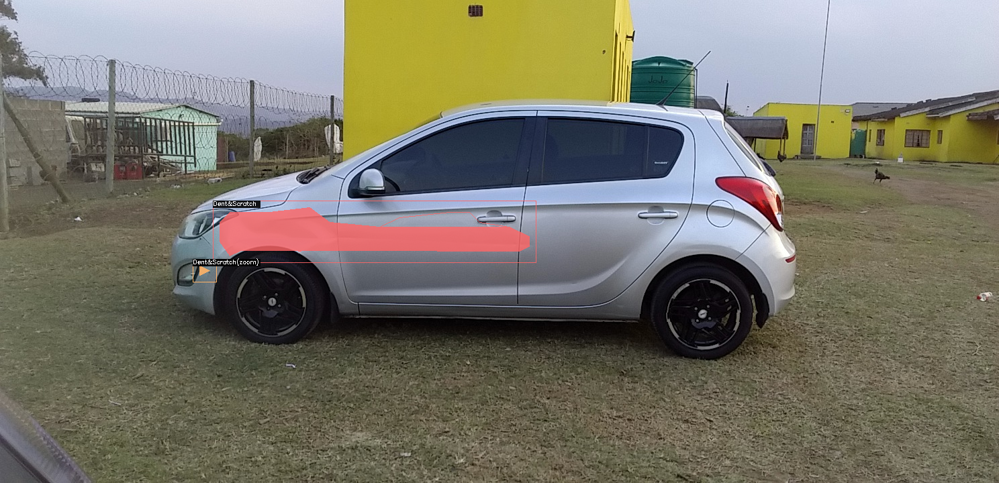

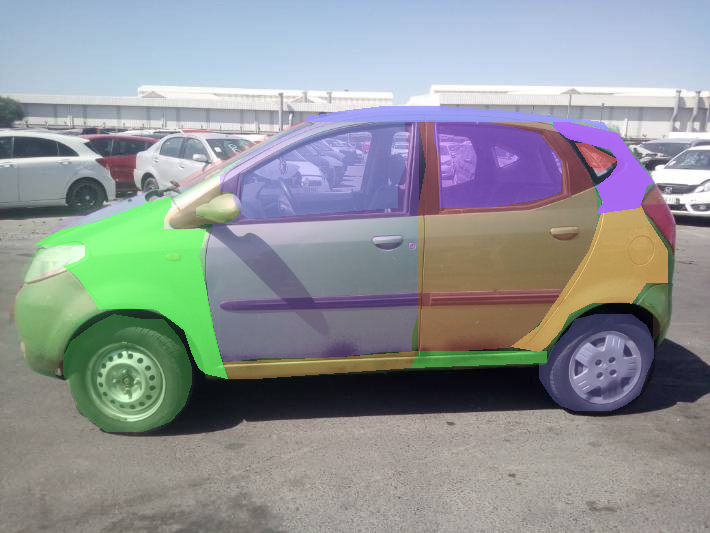

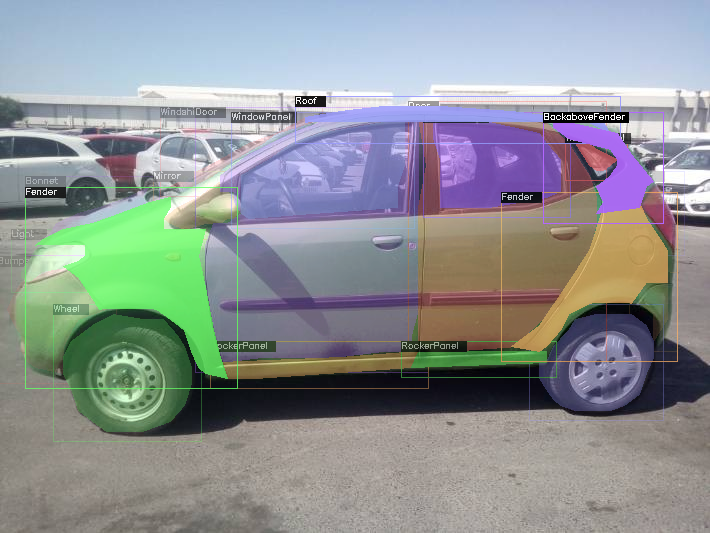

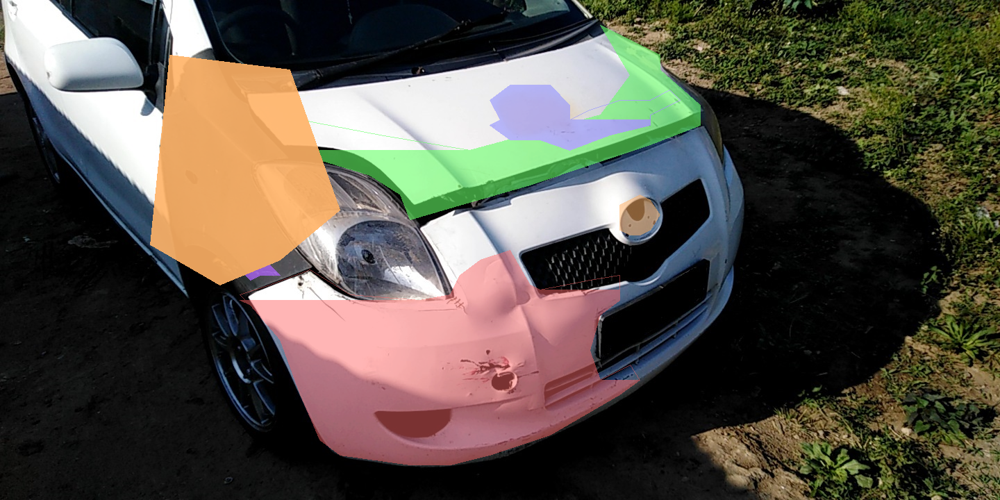

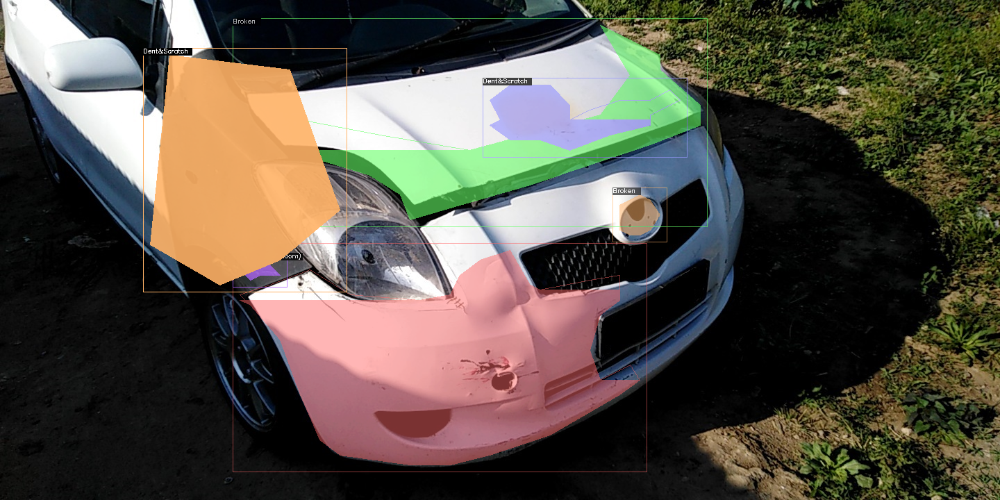

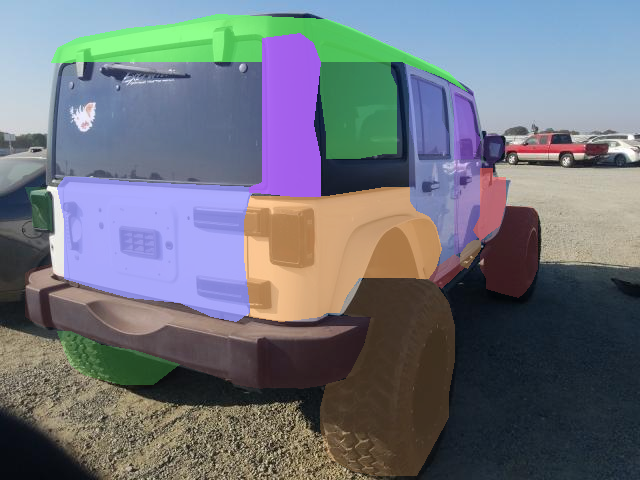

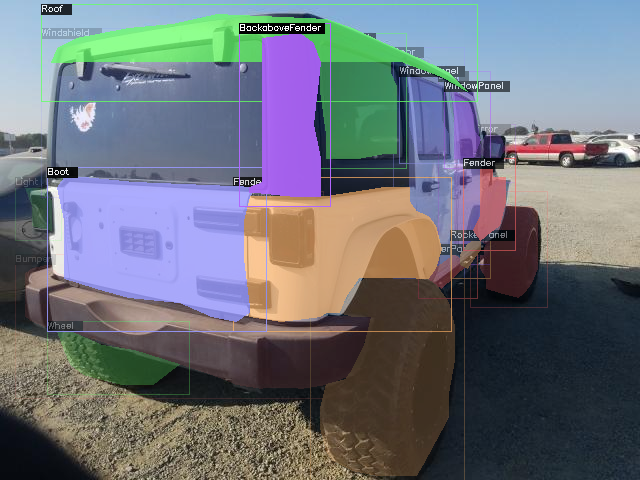

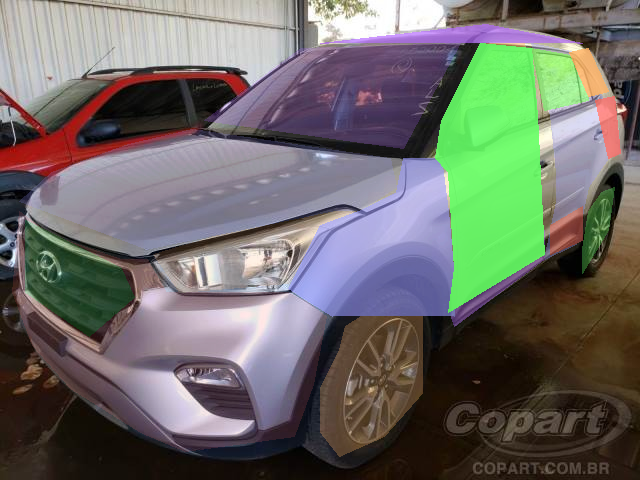

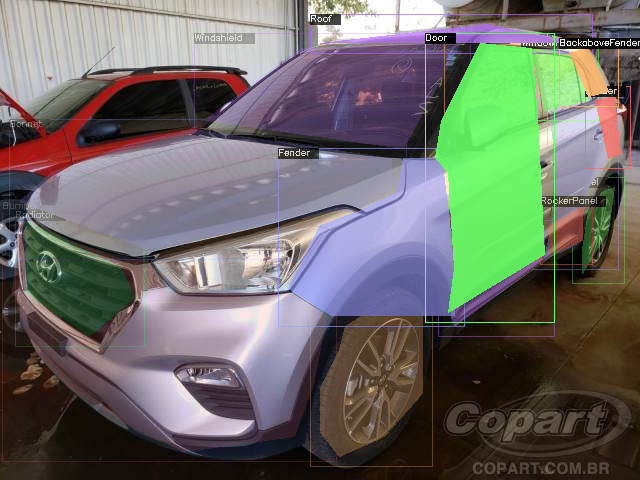

In [29]:
# Making list of different colors to use for polygons and bounding boxes
poly_colors = [[102, 102, 255], [102, 178, 255], [102, 255, 102], [255, 153, 153], [255, 102, 178]]

# Iterating over every .json file
for jfile in os.listdir(data_dir):
  tfile = open("/".join((data_dir, jfile)))
  data = json.load(tfile)
  
  if data[0]["type"] != "polygonlabels":
    data.pop(0)
  
  # Setting image path corresponding to the current .json file
  img = ".".join((jfile.split('.')[0], 'jpg'))
  image_path = "/".join((image_dir, img))

  # Initializing two variables for each visualization
  image_1 = cv2.imread(image_path)
  image_2 = cv2.imread(image_path)

  # Iterating over each set of polygon coordinates present in current .json file
  colors_i = 0
  count = 0
  for dict_ in data:
    cords = np.array(dict_['value']['points'], np.int32)
    image_width = dict_['original_width']
    image_height = dict_['original_height']

    # De-normalizing the coordinates
    cords[:, 0]  = cords[:, 0]*image_width/100
    cords[:, 1]  = cords[:, 1]*image_height/100

    x_max = np.int32(cords[0][0])
    x_min = np.int32(cords[0][0])
    y_max = np.int32(cords[0][1])
    y_min = np.int32(cords[0][1])

    for i in range(len(cords)):

      if cords[i][0] > x_max:
        x_max = cords[i][0]
      elif cords[i][0] < x_min:
        x_min = cords[i][0]
      
      if cords[i][1] > y_max:
        y_max = cords[i][1]
      elif cords[i][1] < y_min:
        y_min = cords[i][1]

    cords = cords.reshape((-1, 1, 2))

    color = (poly_colors[colors_i][0], poly_colors[colors_i][1], poly_colors[colors_i][2])

    # Plotting polygon and its borders
    image_1 = cv2.polylines(image_1, [cords], isClosed=True, color=color, thickness=1)
    image_1 = cv2.fillConvexPoly(image_1, cords, color=color)

    image_2 = cv2.polylines(image_2, [cords], isClosed=True, color=color, thickness=1)
    image_2 = cv2.fillConvexPoly(image_2, cords, color=color)

    # Applying alpha blending to make the polygon transparent
    image_original_1 = cv2.imread(image_path)
    image_original_2 = cv2.imread(image_path)
    image_1 = cv2.addWeighted(image_original_1, 0.1, image_1, 0.9, 0)
    image_2 = cv2.addWeighted(image_original_2, 0.1, image_2, 0.9, 0)

    # Adding bounding box
    image_2 = cv2.rectangle(image_2, (x_min-10, y_min-10), (x_max+10, y_max+10), color=poly_colors[colors_i], thickness=1)

    # Adding text at top left corner
    text = dict_['value']['polygonlabels'][0]
    bbox_size = len(text)*5
    image_2 = cv2.rectangle(image_2, (x_min-10, y_min-10), (x_min+bbox_size, y_min), color=[0,0,0], thickness=-1)
    cv2.putText(image_2, text, (x_min-10, y_min-3), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 255), 1)

    if count == len(data) - 1:
      cv2_imshow(image_1)
      cv2_imshow(image_2)

    count += 1
    colors_i += 1

    if colors_i == 5:
      colors_i = 0
    cv2.destroyAllWindows()
    

**TASK 2.1 - DAMAGE CLASSIFIER**

Importing necessary libraries

In [30]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
import PIL
import tensorflow as tf
import tempfile

from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import pathlib

Loading training and validation data

In [31]:
train_data_dir = "/gdrive/My Drive/Assignment/Task_2/data1a/training"
val_data_dir = "/gdrive/My Drive/Assignment/Task_2/data1a/validation"

batch_size = 32
img_height = 180
img_width = 180

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        train_data_dir,
        validation_split=0,
        seed=123,
        image_size=(img_height, img_width),
        batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        val_data_dir,
        validation_split=0,
        seed=123,
        image_size=(img_height, img_width),
        batch_size=batch_size)

class_names = train_ds.class_names
print(class_names)

Found 1840 files belonging to 2 classes.
Found 460 files belonging to 2 classes.
['00-damage', '01-whole']


Augmenting and Normalizing images

In [32]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Augmentation using random rotation between -20 and 20, and horizontal flip
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

# Normalization
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y), num_parallel_calls=AUTOTUNE)

image_batch, labels_batch = next(iter(train_ds))
first_image = image_batch[0]

print(np.min(first_image), np.max(first_image))

num_classes = len(class_names)

0.00013464177 0.99979055


Creating model

In [33]:
model_1 = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.BatchNormalization(),
  layers.Flatten(),
  layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)),
  layers.Dense(num_classes)
])

model_1.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

# Adding class weights
initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
model_1.save_weights(initial_weights)
model_1.load_weights(initial_weights)

pos = 920
neg = 920
total = neg + pos
weight_for_damaged = (1 / neg) * (total / 2.0)
weight_for_whole = (1 / pos) * (total / 2.0)

class_weight = {0: weight_for_damaged, 1: weight_for_whole}

model_1.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_8 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 128)      

Training and calculating validation accuracy

Epoch 1/10
58/58 [==============================] - 141s 2s/step - loss: 0.8618 - accuracy: 0.6152 - val_loss: 17.3809 - val_accuracy: 0.5000
Epoch 2/10
58/58 [==============================] - 139s 2s/step - loss: 0.7015 - accuracy: 0.6652 - val_loss: 41.4580 - val_accuracy: 0.5000
Epoch 3/10
58/58 [==============================] - 139s 2s/step - loss: 0.6587 - accuracy: 0.6957 - val_loss: 40.8979 - val_accuracy: 0.5000
Epoch 4/10
58/58 [==============================] - 139s 2s/step - loss: 0.6406 - accuracy: 0.7092 - val_loss: 49.6002 - val_accuracy: 0.5000
Epoch 5/10
58/58 [==============================] - 139s 2s/step - loss: 0.6356 - accuracy: 0.7152 - val_loss: 95.9958 - val_accuracy: 0.5000
Epoch 6/10
58/58 [==============================] - 138s 2s/step - loss: 0.6299 - accuracy: 0.7201 - val_loss: 155.9122 - val_accuracy: 0.5000
Epoch 7/10
58/58 [==============================] - 138s 2s/step - loss: 0.6093 - accuracy: 0.7402 - val_loss: 203.4980 - val_accuracy: 0.5000
Epoc

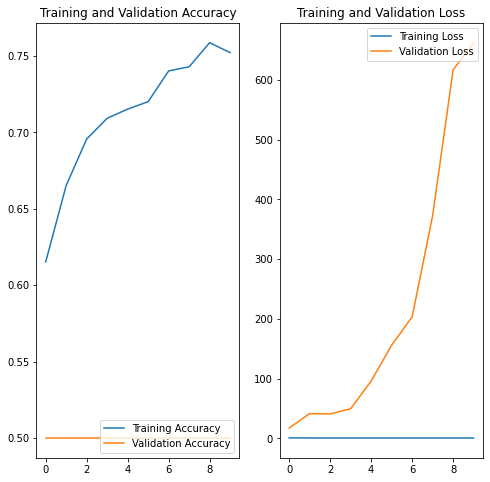

In [34]:
epochs=10
history = model_1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  class_weight=class_weight
)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()